In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [2]:
df=pd.read_excel("compactiv.xlsx")

#EDA

In [3]:
df.head()


,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [4]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [5]:
df.shape

(8192, 22)

In [6]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

There are 8 integer and 13 float value and 1 object value


In [7]:
df.describe(include="all").T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
lread,8192.0,NaN,NaN,NaN,19.559692,53.353799,0.0,2.0,7.0,20.0,1845.0
lwrite,8192.0,NaN,NaN,NaN,13.106201,29.891726,0.0,0.0,1.0,10.0,575.0
scall,8192.0,NaN,NaN,NaN,2306.318237,1633.617322,109.0,1012.0,2051.5,3317.25,12493.0
sread,8192.0,NaN,NaN,NaN,210.47998,198.980146,6.0,86.0,166.0,279.0,5318.0
swrite,8192.0,NaN,NaN,NaN,150.058228,160.47898,7.0,63.0,117.0,185.0,5456.0
fork,8192.0,NaN,NaN,NaN,1.884554,2.479493,0.0,0.4,0.8,2.2,20.12
exec,8192.0,NaN,NaN,NaN,2.791998,5.212456,0.0,0.2,1.2,2.8,59.56
rchar,8088.0,NaN,NaN,NaN,197385.728363,239837.493526,278.0,34091.5,125473.5,267828.75,2526649.0
wchar,8177.0,NaN,NaN,NaN,95902.992785,140841.707911,1498.0,22916.0,46619.0,106101.0,1801623.0
pgout,8192.0,NaN,NaN,NaN,2.285317,5.307038,0.0,0.0,0.0,2.4,81.44


##Checking for duplicate values 

In [8]:
df.duplicated().sum()

0

###Unique values for categorical variables

In [9]:
#Checking the unique variables in the object data type which is RUNQSZ here
for column in df.columns:
    if df[column].dtype == 'object':
        print(column.upper(),': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

RUNQSZ :  2
CPU_Bound        3861
Not_CPU_Bound    4331
Name: runqsz, dtype: int64




##Checking for null values

In [10]:
df.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

Observation:There are null values in rchar and wchar

##Imputing missing values

In [11]:
rchar_mean = df['rchar'].mean()
df['rchar'] = df['rchar'].fillna(rchar_mean)

In [12]:
wchar_mean= df['wchar'].mean()
df['wchar'] = df['wchar'].fillna(wchar_mean)

In [13]:
#checking first few rows of df again
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.00,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.00,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.00,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.00,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.00,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.40,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.20,1.2,2.800,59.56
rchar,8192.0,1.973857e+05,238310.037735,278.0,34860.50,127825.0,265394.750,2526649.00
wchar,8192.0,9.590299e+04,140712.688639,1498.0,22977.75,46653.0,106037.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.00,0.0,2.400,81.44


#Converting categorical to dummy variables

In [15]:
df = pd.get_dummies(df, columns=['runqsz'],drop_first=True)

#Counting number of Zeroes in the columns


In [16]:
# Count number of zeros in all columns of Dataframe
for column_name in df.columns:
    column = df[column_name]
    # Get the count of Zeros in column 
    count = (column == 0).sum()
    print('Count of zeros in column ', column_name, ' is : ', count)

Count of zeros in column  lread  is :  675
Count of zeros in column  lwrite  is :  2684
Count of zeros in column  scall  is :  0
Count of zeros in column  sread  is :  0
Count of zeros in column  swrite  is :  0
Count of zeros in column  fork  is :  21
Count of zeros in column  exec  is :  21
Count of zeros in column  rchar  is :  0
Count of zeros in column  wchar  is :  0
Count of zeros in column  pgout  is :  4878
Count of zeros in column  ppgout  is :  4878
Count of zeros in column  pgfree  is :  4869
Count of zeros in column  pgscan  is :  6448
Count of zeros in column  atch  is :  4575
Count of zeros in column  pgin  is :  1220
Count of zeros in column  ppgin  is :  1220
Count of zeros in column  pflt  is :  3
Count of zeros in column  vflt  is :  0
Count of zeros in column  freemem  is :  0
Count of zeros in column  freeswap  is :  0
Count of zeros in column  usr  is :  283
Count of zeros in column  runqsz_Not_CPU_Bound  is :  3861


Observation:The zeroes in runqsz is NOT_CPU_Bound.Other zeroes are the values of each variable and these are readings of the dataset.There is no need to discard them.

#Checking correlation





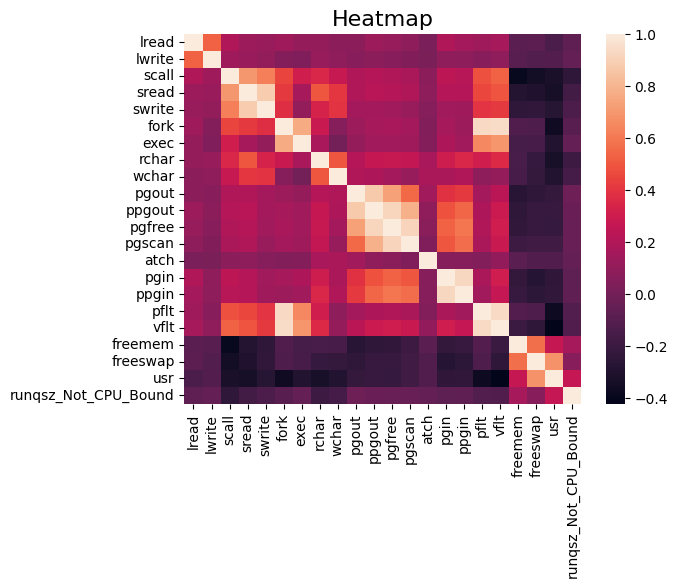

In [17]:
sns.heatmap(df.corr());
plt.title('Heatmap',fontsize=16);

Observations:There are correllation between pflt and vflt with fork ad exec.There are less correlation among some variables as well.But it is not clear from the heatmap alone.

#Checking for Outliers

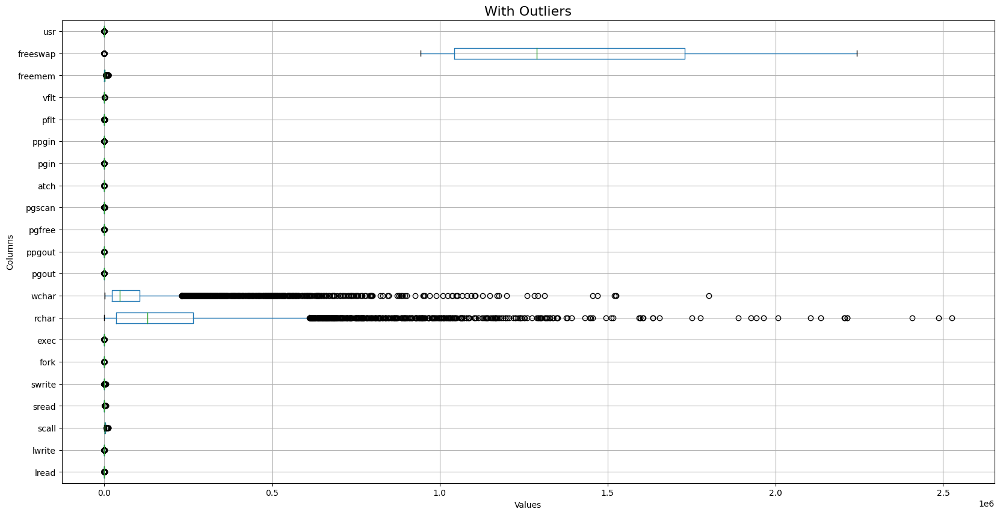

In [18]:
# construct box plot for continuous variables
cont=df.dtypes[(df.dtypes!='uint8') & (df.dtypes!='bool')].index
plt.figure(figsize=(20,10))
df[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.ylabel('Columns')
plt.xlabel('Values')
plt.show()

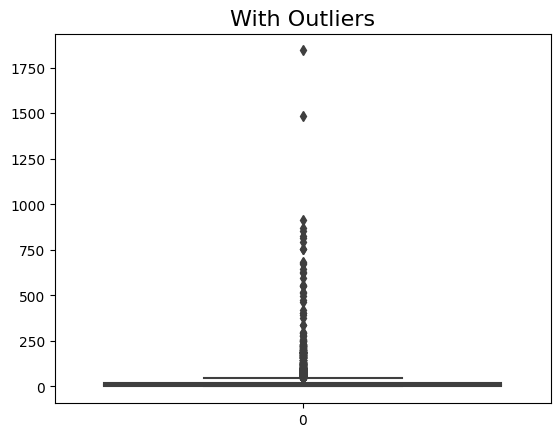

In [19]:
sns.boxplot(data=df['lread'])
plt.title('With Outliers',fontsize=16);


Observations:There are outliers in most of the columns which cannot be observed in the big graph.
Outlier will effect the final output of linear regression.So outlier treatment of all the variables are needed.

In [20]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [21]:
for column in df[cont].columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    
    df[column]=np.where(df[column]<lr,lr,df[column])

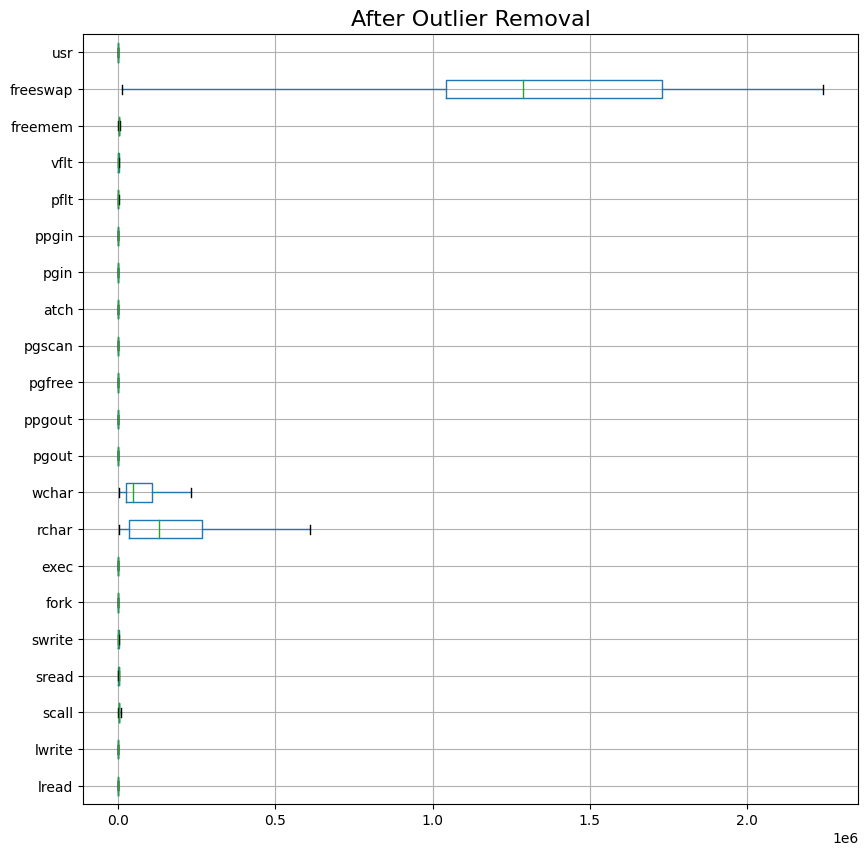

In [22]:
plt.figure(figsize=(10,10))
df[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

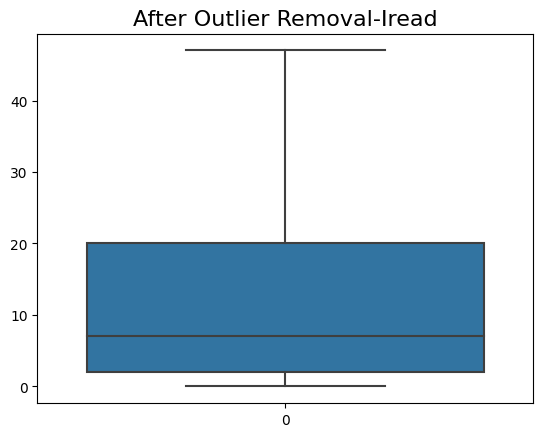

In [23]:
sns.boxplot(data=df['lread'])
plt.title('After Outlier Removal-Iread',fontsize=16);

#Data Distribution

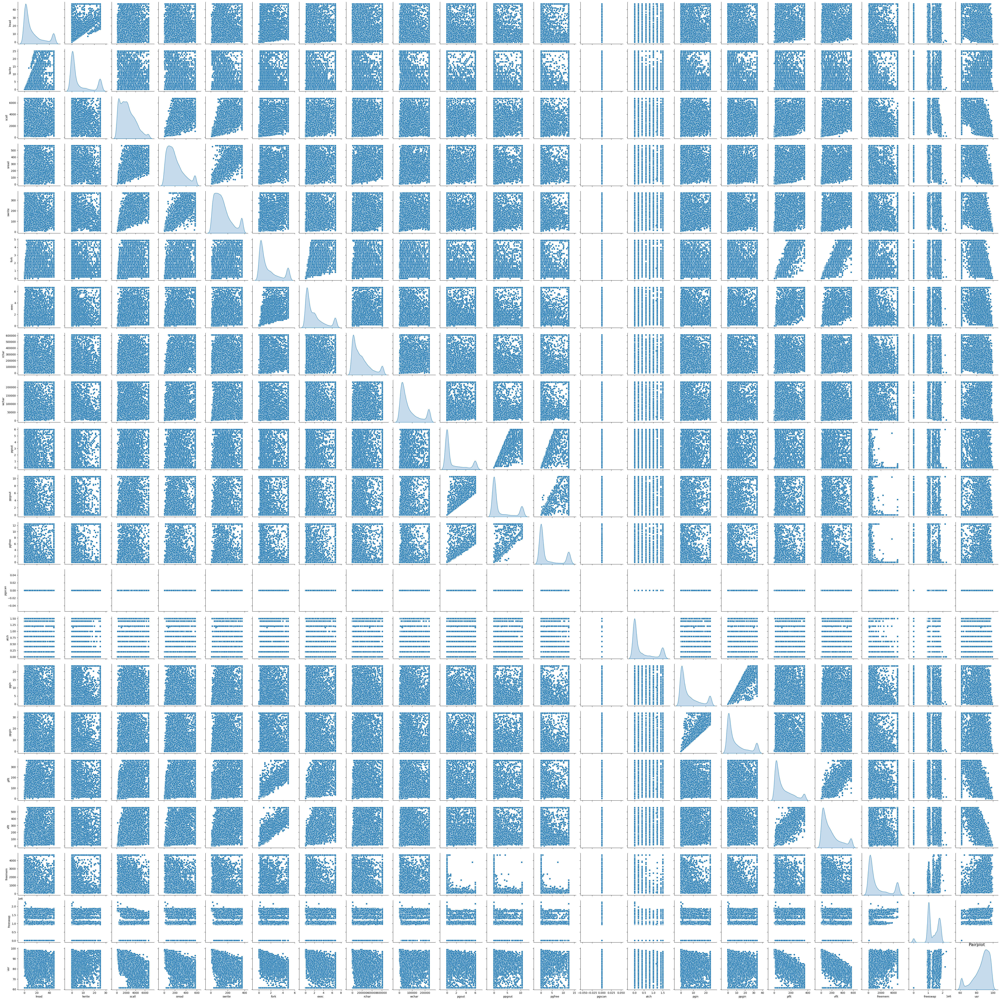

In [24]:
df_attr = (df[cont])
sns.pairplot(df_attr, diag_kind='kde')  
plt.title('Pairplot',fontsize=16);
plt.show()

#Train-Test Split

In [25]:
# Copy all the predictor variables into X dataframe
X = df.drop('usr', axis=1)

# Copy target into the y dataframe. 
y = df[['usr']]

In [26]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,1
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,1
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,1
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,1


In [27]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1)

#Linear Regression Model

In [28]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [29]:
# Let us explore the coefficients for each of the independent attributes

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.06340997319297138
The coefficient for lwrite is 0.048018386139824294
The coefficient for scall is -0.0006643523374681647
The coefficient for sread is 0.00033858757891631485
The coefficient for swrite is -0.005459881814299174
The coefficient for fork is 0.029632995706585494
The coefficient for exec is -0.3210632504852234
The coefficient for rchar is -5.211879156057065e-06
The coefficient for wchar is -5.3463354553914405e-06
The coefficient for pgout is -0.36685229813588227
The coefficient for ppgout is -0.07860920074522165
The coefficient for pgfree is 0.08525820125741097
The coefficient for pgscan is -2.220446049250313e-16
The coefficient for atch is 0.6304380351240481
The coefficient for pgin is 0.019753855912669795
The coefficient for ppgin is -0.0671537211264697
The coefficient for pflt is -0.03359198966258071
The coefficient for vflt is -0.005464921751511607
The coefficient for freemem is -0.0004576614008076155
The coefficient for freeswap is 8.82932

In [30]:
# Let us check the intercept for the model

intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 84.13143842097531


In [31]:
# R square on training data
regression_model.score(X_train, y_train)

0.7961565330395104

R^2 is approximately 79 % which is a good value.

In [32]:
# R square on testing data
regression_model.score(X_test, y_test)

0.7676695029858491

R^2 is 76 % which is almost same as train data R^2 which shows that the model fit is good.

In [33]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.4190166755430935

In [34]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

4.652920160995822

###Linear Regression using statsmodels(OLS)

In [35]:
import statsmodels.api as sm

In [36]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)


In [37]:
model = sm.OLS(y_train,X_train).fit()
model

In [38]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1116.
Date:                Sun, 23 Apr 2023   Prob (F-statistic):               0.00
Time:                        13:28:42   Log-Likelihood:                -16656.
No. Observations:                5734   AIC:                         3.335e+04
Df Residuals:                    5713   BIC:                         3.349e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1314      0.316    266.122      0.000      83.512      84.751
lread                   -0.0634      0.009     -7.064      0.000      -0.081      -0.046
lwrite                   0.0480      0.013      3.660      0.000       0.022       0.074
scall                   -0.0007   6.28e-05    -10.576      0.000      -0.001      -0.001
sread                    0.0003      0.001      0.336      0.737      -0.002       0.002
swrite                  -0.0055      0.001     -3.805      0.000      -0.008      -0.003
fork                     0.0296      0.132      0.225      0.822      -0.229       0.288
exec                    -0.3211      0.052     -6.219      0.000      -0.422      -0.220
rchar                -5.212e-06   4.87e-07    -10.696      0.000   -6.17e-06   -4.26e-06
wchar                -5.346e-06   1.03e-06     -5.179      0.000   -7.37e-06   -3.32e-06
pgout                   -0.3669      0.090     -4.077      0.000      -0.543      -0.190
ppgout                  -0.0786      0.079     -0.999      0.318      -0.233       0.076
pgfree                   0.0853      0.048      1.786      0.074      -0.008       0.179
pgscan               -8.455e-15   4.41e-17   -191.744      0.000   -8.54e-15   -8.37e-15
atch                     0.6304      0.143      4.414      0.000       0.350       0.910
pgin                     0.0198      0.028      0.695      0.487      -0.036       0.076
ppgin                   -0.0672      0.020     -3.406      0.001      -0.106      -0.029
pflt                    -0.0336      0.002    -16.954      0.000      -0.037      -0.030
vflt                    -0.0055      0.001     -3.831      0.000      -0.008      -0.003
freemem                 -0.0005   5.07e-05     -9.022      0.000      -0.001      -0.000
freeswap              8.829e-06    1.9e-07     46.463      0.000    8.46e-06     9.2e-06
runqsz_Not_CPU_Bound     1.6137      0.126     12.807      0.000       1.367       1.861
==============================================================================
Omnibus:                     1102.551   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2367.549
Skew:                          -1.118   Prob(JB):                         0.00
Kurtosis:                       5.216   Cond. No.                     1.64e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 4.24e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [39]:
#Calculate MSE on train
predicted_train=model.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)

In [40]:
np.sqrt(mse) #RMSE on train 

4.419016675543094

In [41]:
# Prediction on Test data
y_pred = model.predict(X_test)

In [42]:
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

4.652920160996985

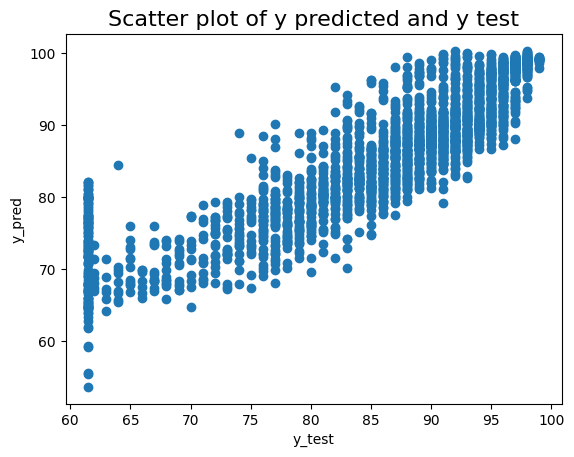

In [43]:
plt.scatter(y_test, y_pred)
plt.title('Scatter plot of y predicted and y test',fontsize=16)
plt.ylabel('y_pred')
plt.xlabel('y_test')
plt.show()

In [44]:
for i,j in np.array(model.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(84.13) * const + (-0.06) * lread + (0.05) * lwrite + (-0.0) * scall + (0.0) * sread + (-0.01) * swrite + (0.03) * fork + (-0.32) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.37) * pgout + (-0.08) * ppgout + (0.09) * pgfree + (-0.0) * pgscan + (0.63) * atch + (0.02) * pgin + (-0.07) * ppgin + (-0.03) * pflt + (-0.01) * vflt + (-0.0) * freemem + (0.0) * freeswap + (1.61) * runqsz_Not_CPU_Bound + 

The final Linear Regression equation is
urs=(84.13) * const + (-0.06) * lread + (0.05) * lwrite + (-0.0) * scall + (0.0) * sread + (-0.01) * swrite + (0.03) * fork + (-0.32) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.37) * pgout + (-0.08) * ppgout + (0.09) * pgfree + (-0.0) * pgscan + (0.63) * atch + (0.02) * pgin + (-0.07) * ppgin + (-0.03) * pflt + (-0.01) * vflt + (-0.0) * freemem + (0.0) * freeswap + (1.61) * runqsz_Not_CPU_Bound + 

There are many negative coefficients,zero coefficients and also more than 1 coefficients are there.

With the increase of 1 unit in atch(Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second) there is a increase in 0.63 unit of urs.

With the increase of 1 unit in Process run queue size there is a increase in 1.61 unit of urs.